In [1]:
# Import my packages.
import flymovie as fm
import os
import copy
import scipy
import numpy as np
import matplotlib.pyplot as plt

# Activate package autoload.
%load_ext autoreload
%autoreload 2

In [2]:
eve2 = fm.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/ms2_mv_obects/20210621-rpb1egfp-eve-em2-02-09.pkl')

(SpearmanrResult(correlation=0.530140626276991, pvalue=1.9039249423424996e-198), (0.5933740701638761, 2.3475095530323913e-260))
(SpearmanrResult(correlation=0.49348841213936057, pvalue=3.5861393252514977e-168), (0.5606180701572034, 1.2829818452616168e-226))
(SpearmanrResult(correlation=0.38067575567471534, pvalue=3.334934567031334e-95), (0.39498145944823904, 5.511499544439778e-103))
(SpearmanrResult(correlation=0.38332683957100927, pvalue=1.288588003810239e-96), (0.4056854281326967, 4.586521269999872e-109))


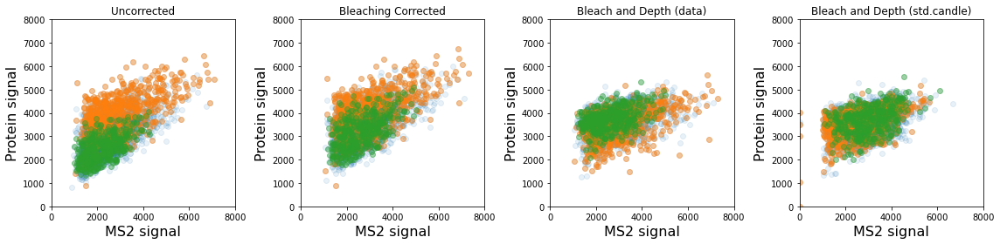

In [3]:
mv = eve2
def plot_cor(df1, df2, ax, title):
    def calc_cors(df1, df2):
        vals1 = df1.to_numpy().flatten()
        vals2 = df2.to_numpy().flatten()
        good_vals = ~np.isnan(vals1)
        vals1 = vals1[good_vals]
        vals2 = vals2[good_vals]
        return scipy.stats.spearmanr(vals1, vals2), scipy.stats.pearsonr(vals1, vals2)
    ax.scatter(df1, df2, alpha=0.1)
    ax.scatter(df1.iloc[:20,:], df2.iloc[:20,:], alpha=0.4)
    ax.scatter(df1.iloc[60:80,:], df2.iloc[60:80,:], alpha=0.4)
    ax.set_xlim(0,8000)
    ax.set_ylim(0,8000)
    ax.set_xlabel('MS2 signal', size=16)
    ax.set_ylabel('Protein signal', size=16)
    ax.set_title(title)
    plt.tight_layout()
    print(calc_cors(df1, df2))

ax = fm.qax(4)
plot_cor(mv.ms2_uncorr, mv.prot_uncorr, ax[0], 'Uncorrected')
plot_cor(mv.ms2_bleachcorr, mv.prot_bleachcorr, ax[1], "Bleaching Corrected")
plot_cor(mv.ms2_fromdata, mv.prot_fromdata, ax[2], 'Bleach and Depth (data)')
plot_cor(mv.ms2_stdcandle, mv.prot_stdcandle, ax[3],'Bleach and Depth (std.candle)')


In [3]:
eve3 = fm.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/ms2_mv_obects/20210621-rpb1egfp-eve-em3-02-07.pkl')

(SpearmanrResult(correlation=0.4995731237157298, pvalue=5.068836312177067e-251), (0.23220285119852063, 5.290849031445919e-50))
(SpearmanrResult(correlation=0.44316093405409446, pvalue=1.1631924079292425e-191), (0.19665940450375904, 4.3637502975140174e-36))
(SpearmanrResult(correlation=0.3722522167108579, pvalue=2.1111645412893754e-131), (0.16036950953944448, 2.1066136380841054e-24))
(SpearmanrResult(correlation=0.44254229344389945, pvalue=4.535917031372212e-191), (0.37259370560604244, 1.1703664140789615e-131))


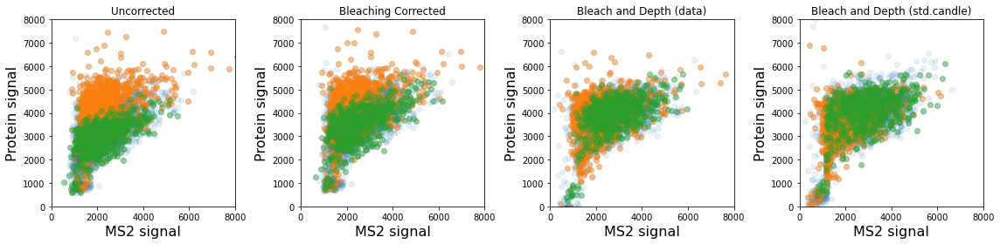

In [9]:
mv = eve3
ax = fm.qax(4)
plot_cor(mv.ms2_uncorr, mv.prot_uncorr, ax[0], 'Uncorrected')
plot_cor(mv.ms2_bleachcorr, mv.prot_bleachcorr, ax[1], "Bleaching Corrected")
plot_cor(mv.ms2_fromdata, mv.prot_fromdata, ax[2], 'Bleach and Depth (data)')
plot_cor(mv.ms2_stdcandle, mv.prot_stdcandle, ax[3],'Bleach and Depth (std.candle)')


OK what am I doing?

Seems to be a significant correlation betwixt protein and MS2 that is robust to depth adn bleaching correction. That's good. The money has always been in temporal relationships. 

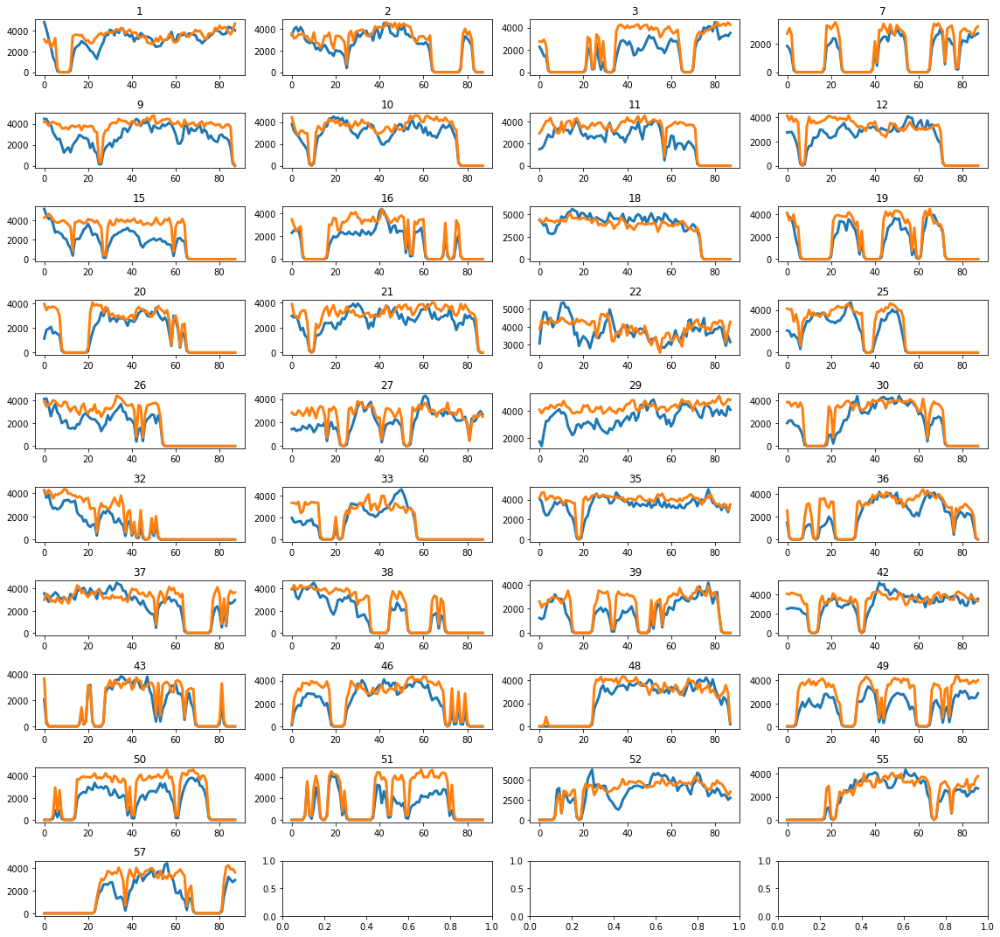

In [24]:
mv = eve2
depth = fm.movie.make_spot_table(mv.spot_data_plusdepth, 12)
fm.spotdf_plot_traces([mv.ms2_stdcandle, mv.prot_stdcandle], 40, norm=False, sigma=0.5)

In [19]:
from scipy.signal import correlate
def plot_crosscorr(df1, df2,xlim=[0,6000], ylim=[0,8000], minlen=0, funct=lambda x: x, channel=0):
    #x = df_filter_trajlen(mv.intvol, minlen), mv.stack[channel]).apply(funct).to_numpy().flatten()
    x = fm.df_filter_minlen(df1, minlen).to_numpy().flatten()
    y = fm.df_filter_minlen(df2, minlen).to_numpy().flatten()
    #y = bleach_corr(df_filter_trajlen(mv.prot, minlen), mv.stack[channel]).apply(funct).to_numpy().flatten()
    x[np.isnan(x)] = 0
    y[np.isnan(y)] = 0
    return x,y
    """
    plt.scatter(x,y, alpha=0.1)
    plt.ylim(ylim)
    plt.xlim(xlim)
    (m,b),_ = curve_fit(abline, x[y < 10000], y[y < 10000])
    x1 = np.arange(-30000,30000)
    y1 = (x1 * m) + b
    plt.plot(x1, y1, color="orange")
    """
x,y = plot_crosscorr(mv.ms2_stdcandle, mv.ms2_stdcandle)

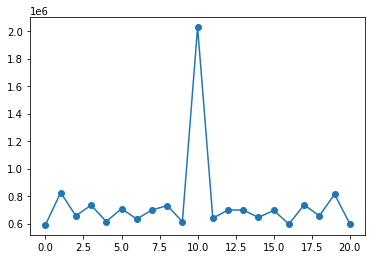

In [22]:
mv = eve3
x,y=plot_crosscorr(mv.ms2_uncorr, mv.ms2_stdcandle)
c=correlate(x,y)
width = 10
midpoint = int(c.shape[0] / 2)
start = midpoint - width
end = midpoint + width + 1
a = np.repeat(1, x.shape)
c0 = correlate(a,a)
c_norm = c / c0
plt.plot(c_norm[start:end], marker="o");

In [251]:
import scipy.ndimage as ndi

def make_control_spot_data(spot_data, nucmask_orig):
    nucmask = copy.deepcopy(nucmask_orig)
    nucmask = fm.labelmask_apply_morphology(nucmask, ndi.morphology.binary_erosion, struct=np.ones((1,1,5,5)), expand_size=(1,1,5,5))
    spot_data_rand = copy.deepcopy(spot_data)
    for spot_id in spot_data:
        data = spot_data[spot_id]
        for rownum in range(0, data.shape[0]):
            frame = int(data[rownum, 0])
            nuc_id = data[rownum, 1]
            old_i = data[rownum, 3]
            old_j = data[rownum, 4]
            z = int(data[rownum, 2])
            coords_i, coords_j = np.where(nucmask[frame, z] == nuc_id)
            if (len(coords_i) > 0):
                rand_idx = np.random.randint(0, len(coords_i))
                new_i = coords_i[rand_idx]
                new_j = coords_j[rand_idx]
                #print(old_i, new_i)
            else:
                print('no nuc')
                old_i = data[rownum, 3]
                old_j = data[rownum, 4]
                new_i = old_i + np.random.randint(0,10) - 5
                new_j = old_j + np.random.randint(0,10) - 5
        #print(new_i)
            spot_data_rand[spot_id][rownum, 3] = new_i
            spot_data_rand[spot_id][rownum, 4] = new_j
    return spot_data_rand

spot_data_rand = make_control_spot_data(em2.spot_data, em2.nucmask)


In [253]:
fm.quickview_ms2(em2.stack, spot_data_rand)

interactive(children=(Dropdown(description='Color', index=10, options=('gray', 'magma', 'viridis', 'plasma', '…

In [254]:
mv_rand = copy.deepcopy(em2)
mv_rand.spot_data = spot_data_rand


In [185]:
nucchannel = 0
spotchannel = 1

surface_before = -909.25
surface_after = -919.08

# Set files for output movie object and input files.
czi_folder = '/Volumes/Stadler100/2021-06-21/'

czi_files = ['20210621-rpb1egfp-eve-em2-02.czi',
    '20210621-rpb1egfp-eve-em2-03.czi',
    '20210621-rpb1egfp-eve-em2-04.czi',
    '20210621-rpb1egfp-eve-em2-05.czi',
    '20210621-rpb1egfp-eve-em2-06.czi',
    '20210621-rpb1egfp-eve-em2-07.czi',
    '20210621-rpb1egfp-eve-em2-08.czi',
    '20210621-rpb1egfp-eve-em2-09.czi'
]

stack, join_frames, starting_positions, z_interval = fm.read_czi_multiple(czi_files, czi_folder)
del stack

10 20 30 40 50 10 20 30 40 50 /Users/michaelstadler/Bioinformatics/Projects/rpb1/bin/flymovie/analyze.py:336: UserWarning: Warning: reference slice less than 0.
  warnings.warn('Warning: reference slice less than 0.')
/Users/michaelstadler/Bioinformatics/Projects/rpb1/bin/flymovie/analyze.py:336: UserWarning: Warning: reference slice less than 0.
  warnings.warn('Warning: reference slice less than 0.')


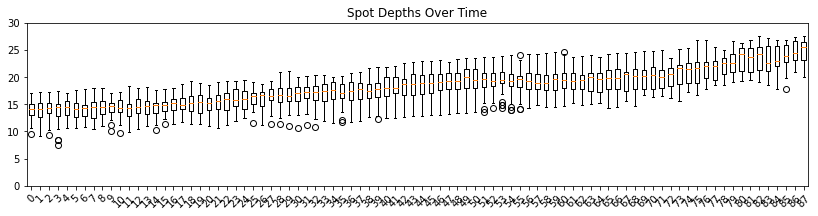

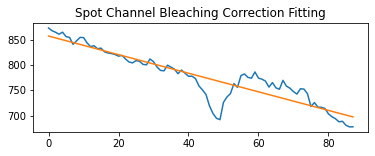

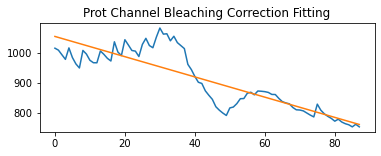

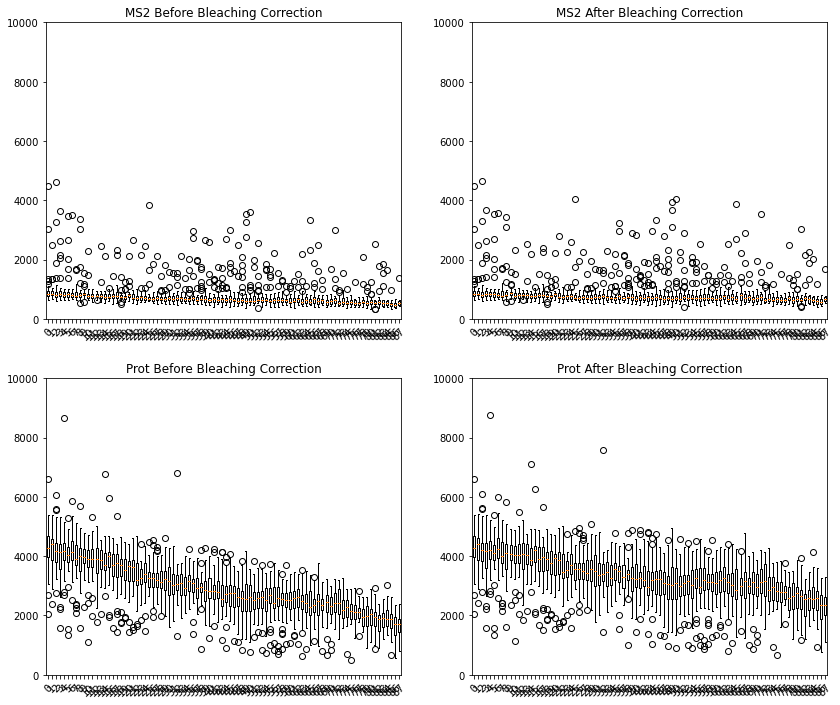

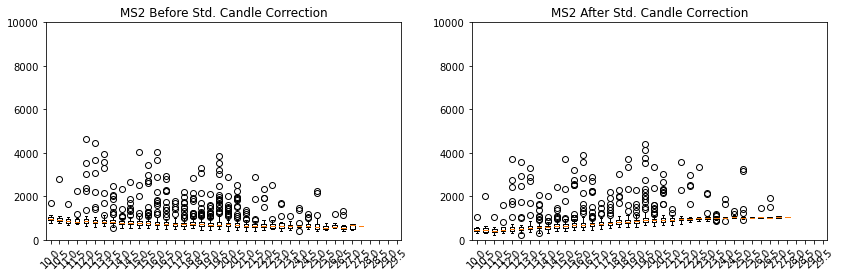

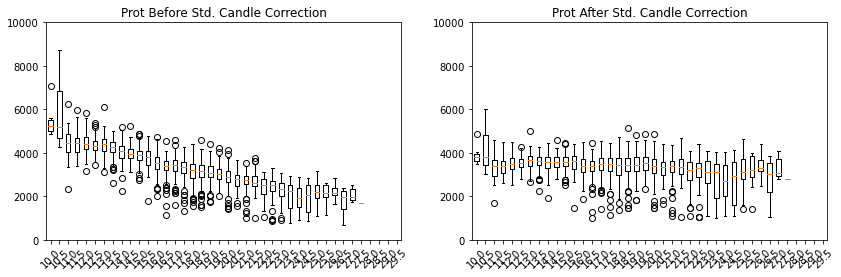

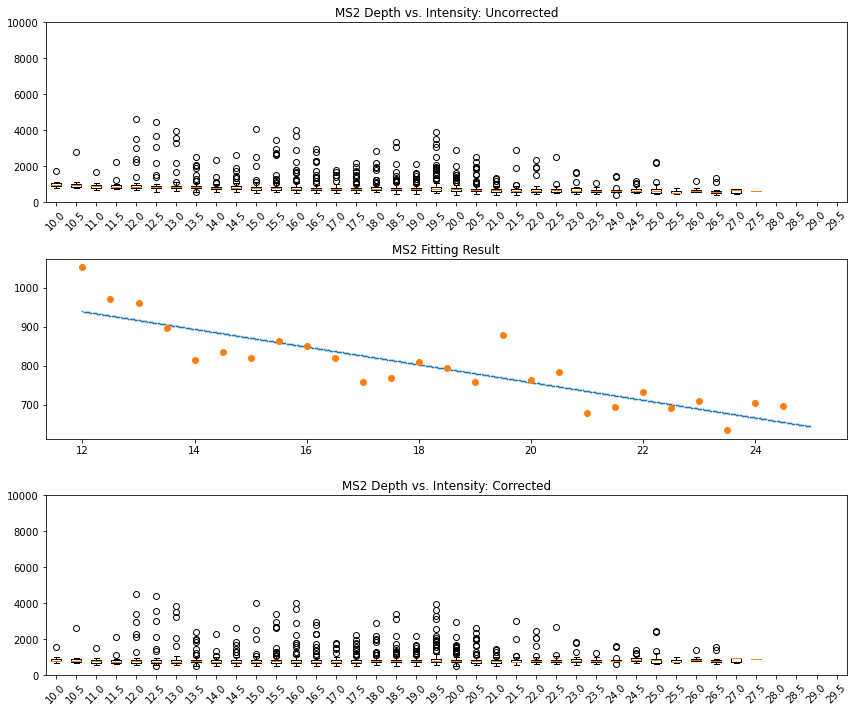

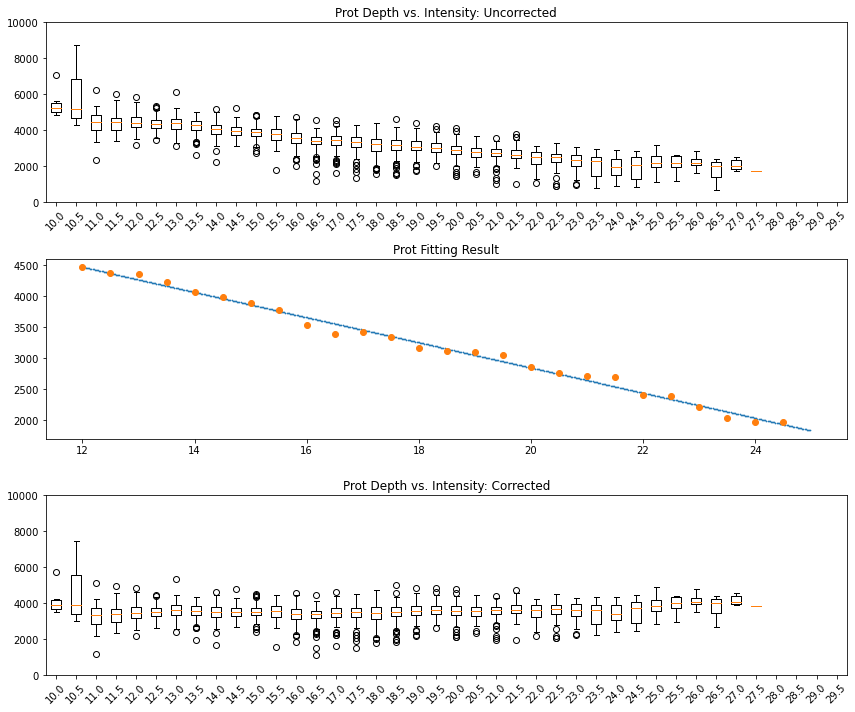

In [255]:
paramgrids = fm.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210616-depth-correction-params.pkl')

fm.mv_process_apply_corrections(mv_rand, paramgrids, surface_before, surface_after, join_frames, starting_positions, z_interval, ij_rad=5)


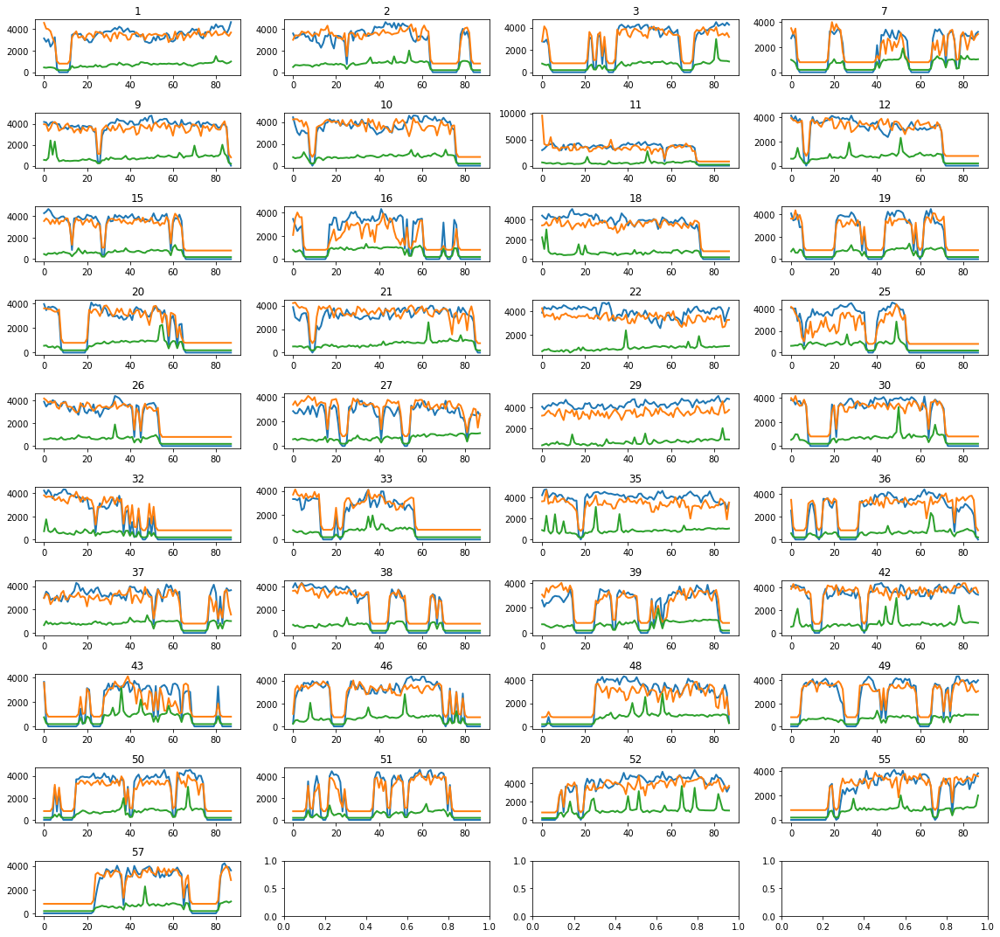

In [265]:
fm.spotdf_plot_traces([em2.prot_stdcandle, mv_rand.prot_stdcandle, mv_rand.ms2_stdcandle], 40, norm=False, sigma=0.5)

In [23]:
mv = mv_random
x,y=plot_crosscorr(mv.ms2_uncorr, mv.ms2_stdcandle)
c=correlate(x,y)
width = 10
midpoint = int(c.shape[0] / 2)
start = midpoint - width
end = midpoint + width + 1
a = np.repeat(1, x.shape)
c0 = correlate(a,a)
c_norm = c / c0
plt.plot(c_norm[start:end], marker="o");

NameError: name 'mv_random' is not defined

### What am I doing here?

Need to analyze these signals, basically, to determine if they have a temporal relationship. It's also worth saying that it's a little unclear what the right way to look at protein signal is. Maybe doing something different in the processing is important.

Currently, just using an equal volume pixel mean for both MS2 and protein. Maybe re-compute with maximum values? 

In [63]:
sna3_2 = fm.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/ms2_mv_obects/20210701-rpb1egfp-sna-em3-01-07.pkl')

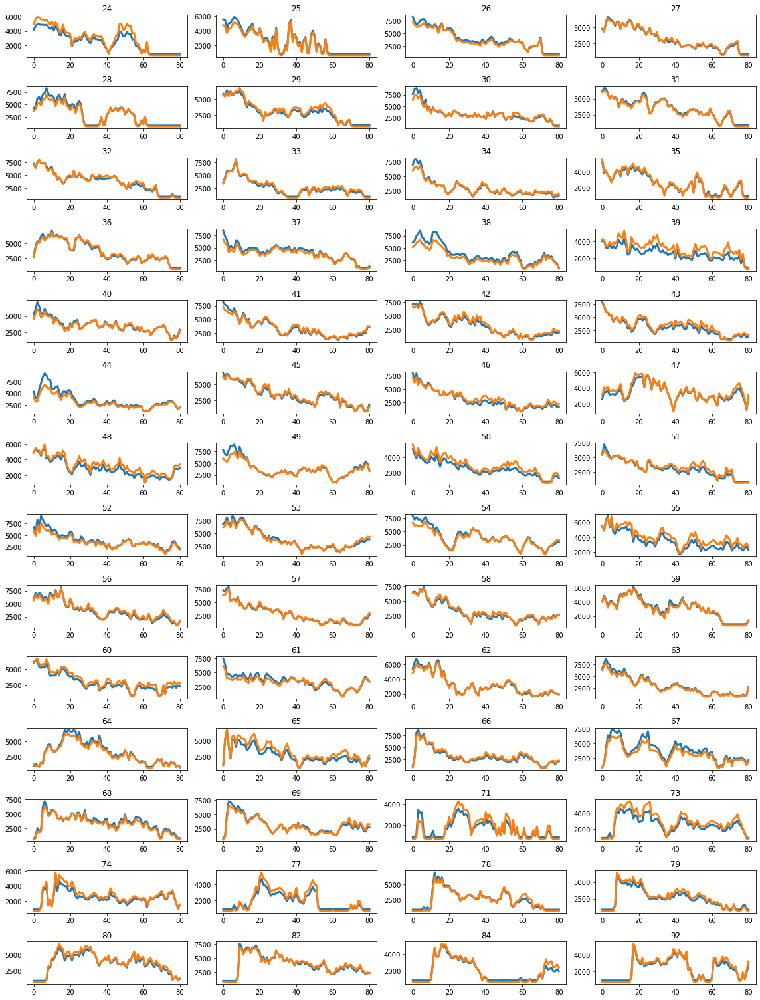

In [230]:
fm.spotdf_plot_traces([sna3.ms2_bleachcorr, sna3.ms2_stdcandle], 40, norm=False, sigma=0.5)

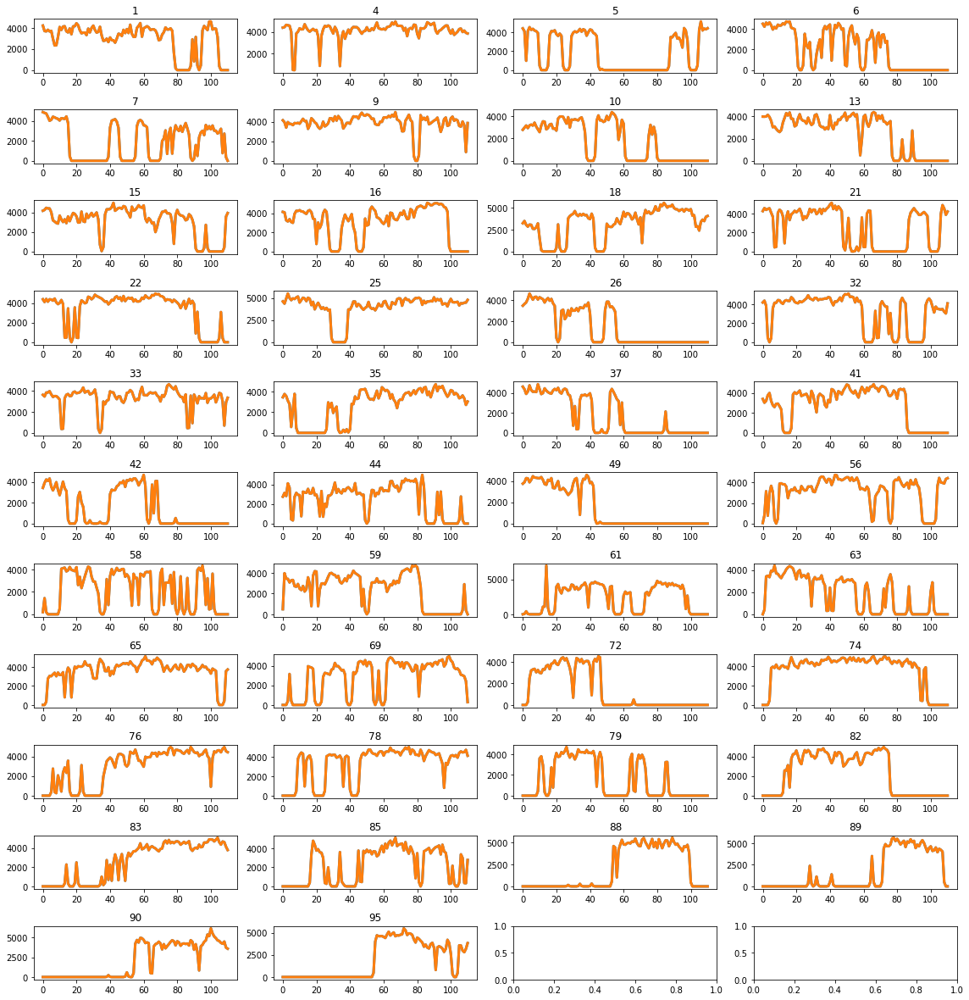

In [257]:
fm.spotdf_plot_traces([eve3.prot_stdcandle, eve3.prot_stdcandle], 40, norm=False, sigma=0.5)

In [41]:
ms2 = fm.spot_movies(eve2.stack, eve2.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5].mean(axis=(2,1))
prot = fm.spot_movies(eve2.stack, eve2.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5].mean(axis=(2,1))
fm.viewer([ms2, prot], 5, order='sxy')

In [56]:
mv = sna3
#ms2 = fm.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5].mean(axis=(2,1))
#prot = fm.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5].mean(axis=(2,1))
ms2 = fm.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5].mean(axis=(2))
prot = fm.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5].mean(axis=(2))
fm.viewer([ms2, prot], 4, order='stxy')

interactive(children=(Dropdown(description='Color', index=2, options=('Gators', 'gray_r', 'cividis', 'viridis'…

## Let's do correlation right

I've played around with cross-correlation (and accompanying auto-correlation) but never figured out how to normalize the data properly. Let's do that. It looks like there are a few issues to resolve:
- How to handle multiple input sequences?
- How to handle nan?
- How to normalize?

I think the first can be handled in a rather brute force way (combining individual cc's), and the normalizztion seems to have some principled methods. 

In [75]:
import scipy.signal

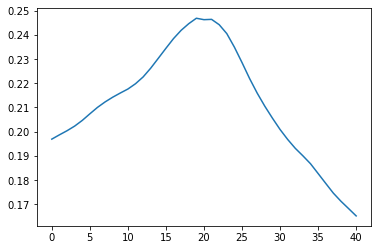

In [137]:
def spotdfs_crosscorr(df1, df2, rolling_window=3, max_lag=20, norm=True):
    def norm(series):
        normed = (series - series.min()) / (series.max() - series.min())
        return normed
    if df1.shape != df2.shape:
        raise ValueError('DFs must have the same shape')
    vector_length = (2 * max_lag) + 1
    crosscorr_sum = np.zeros(vector_length)
    crosscorr_counts = np.zeros(vector_length)
    for i in range(0, df1.shape[1]):
    #for i in [0]:
        series1 = df1.iloc[:,i].rolling(rolling_window, center=True).mean()
        series2 = df2.iloc[:,i].rolling(rolling_window, center=True).mean()
        if norm:
            series1 = norm(series1)
            series2 = norm(series2)
        for lag in np.arange((-1 * max_lag), (max_lag + 1)):
            series2_lagged = series2.shift(lag)
            convolution = series1 * series2_lagged
            idx = lag + max_lag
            non_nan_count = np.count_nonzero(~np.isnan(convolution))
            crosscorr_counts[idx] += non_nan_count
            sum_ = convolution.sum()
            crosscorr_sum[idx] += sum_
    
    # Subtracting 1 gives the unbiased estimator of the cross-corr (I think this is right).
    return crosscorr_sum, crosscorr_counts - 1



sum_, counts = spotdfs_crosscorr(sna3.ms2_stdcandle, sna3.prot_stdcandle)
plt.plot(sum_ / counts)

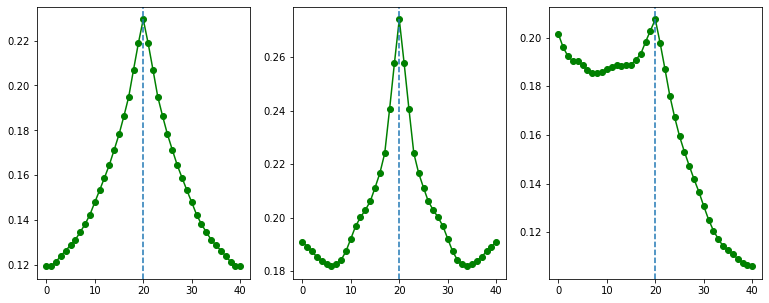

In [241]:
mv = sna3_2
f_start=0
f_end=40
minlen=25
ms2 = fm.df_filter_minlen(mv.ms2_stdcandle.iloc[f_start:f_end, :], minlen)
prot = fm.df_filter_minlen(mv.prot_stdcandle.iloc[f_start:f_end, :], minlen)

norm=True
fig, ax = plt.subplots(1,3, figsize=(13,5))
sum_, counts = spotdfs_crosscorr(ms2, ms2, norm=norm, max_lag=20)
ax[0].plot(sum_ / counts, marker="o", color='green');
ax[0].axvline(20, linestyle='--');

sum_, counts = spotdfs_crosscorr(prot, prot, norm=norm, max_lag=20)
ax[1].plot(sum_ / counts, marker="o", color='green');
ax[1].axvline(20, linestyle='--');

sum_, counts = spotdfs_crosscorr(ms2, prot, norm=norm, max_lag=20)
ax[2].plot(sum_ / counts, marker="o", color='green');
ax[2].axvline(20, linestyle='--');


The above function handles things in the following way: handle each "sequence" (time series for a spot) separately. For each lag, compute the convolution (element-wise multiplication), add the sum to a running total for all data as well as the count of non-nan values (dividing would give the mean which is the normalized cross-correlation). Nan values are ignored, and there is no correlating betwixt unrelated sequences. Normalization can be done by dividing the sum (raw cross-correlation) by N-1 for the unbiased estimator. The -1 obviously irrelevant here...

Running this on my four datasets (2x eve, 1x great Sna, 1x questionable sna) gives a consistent result showing a correlation 

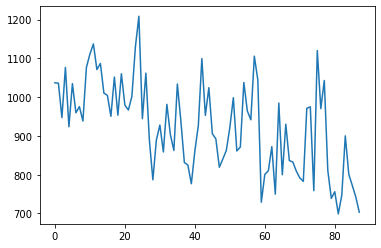

In [253]:
plt.plot(eve2.ms2_stdcandle.std(axis=1))

In [200]:
# Test the above...
def df_shift(df, shift):
    df_shifted = df.copy()
    for i in range(0, df.shape[1]):
        df_shifted.iloc[:,i] = df.iloc[:,i].shift(shift)
    return df_shifted
_=df_shift(sna3.ms2_stdcandle, 5)

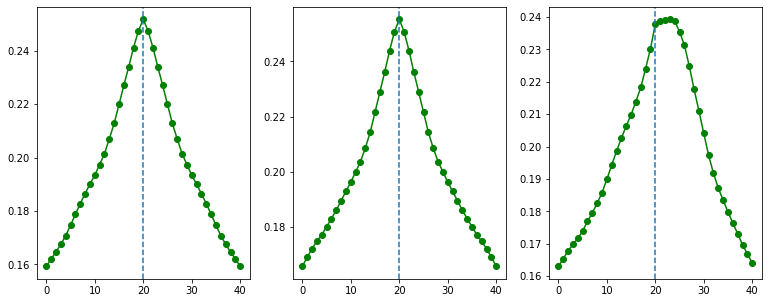

In [254]:
mv = sna3
ms2 = mv.ms2_stdcandle
prot = df_shift(ms2, -5)

norm=True
fig, ax = plt.subplots(1,3, figsize=(13,5))
sum_, counts = spotdfs_crosscorr(ms2, ms2, norm=norm, max_lag=20)
ax[0].plot(sum_ / counts, marker="o", color='green');
ax[0].axvline(20, linestyle='--');

sum_, counts = spotdfs_crosscorr(prot, prot, norm=norm, max_lag=20)
ax[1].plot(sum_ / counts, marker="o", color='green');
ax[1].axvline(20, linestyle='--');

sum_, counts = spotdfs_crosscorr(ms2, prot, norm=norm, max_lag=20)
ax[2].plot(sum_ / counts, marker="o", color='green');
ax[2].axvline(20, linestyle='--');

OK, the above is a bit of a mess. The cross-correlation function "works", but gives some odd results. For eve, it looks perfectly reasonable: ms2 signal shows a CC peak with protein values that *precede* it. So far so good. Sna, however, goes off the rails, showing strong long-term correlations with protein signal *after*, which doesn't make any sense on any level (persists way too long and wrong direction). Dataset 3-2 is particularly bonkers.

It seems like what's going on is that the data are violating the assumptions of the cross-correlation. Specifically, cc works for stationary processes: time series data where the mean and variance do not change with time. Plotting signal vs. time, the eve datasets are relatively flat, but the Sna sets are resolutely not. In the wonky 3-2 dataset, the MS2 signal declines over time and the protein signal increases. This quite intuitively would give a strong signal of increased cc on the left of the above plots (higher corr. between early MS2 and late protein), which is what we see.

What to do? Nulling out the time variance is one thing, introducing a time normalization. 

Dangers and uses of cross-correlation in analyzing time series in perception, performance, movement, and neuroscience: The importance of constructing transfer function autoregressive models. Dean and Dunsmuir in Behavior Research Methods.

In [264]:
0.002 * 0.05 * 40 * 365

1.46

In [10]:
import statsmodels

In [267]:
import statsmodels.api as sm
from patsy import dmatrices

### Update

Ok, I've learned a lot about time series analysis. I want to try to approach this in a more sophisticated way, using ARIMA models (or some subset thereof). Something that is still unsolved is how to combine my series. It's unclear what the right move is here, but I'm going to try combining contiguous paths of some length using NA buffers. I'll work out the compatability later.

On combining series: It looks as if the thing I'm looking for is analyzing groups of time series via "local" analysis (fit a model to each series separately) vs. "global" fit a model to all the series together.




In [11]:
def make_test():
    test = np.array([])
    for i in range(0,20):
        sig = np.random.randn(50)
        buffer = np.repeat(np.nan,20)
        test = np.concatenate([test, sig, buffer])
    return test
test = make_test()

In [12]:
import statsmodels.tsa as tsa

In [15]:
statsmodels.tsa.stattools.pacf_burg

AttributeError: module 'statsmodels.tsa' has no attribute 'stattools'

In [13]:
plt.plot(tsa.stattools.pacf(test));

AttributeError: module 'statsmodels.tsa' has no attribute 'stattools'

In [306]:
rep = pd.read_csv('/Users/michaelstadler/Desktop/pandas_dataframe.csv')

In [396]:
rep1 = rep[['comment',  'code', 'function_block_num_lines_50%', 'absolute_paths_num_lines_max', 'if_block_num_lines_mean']]
rep1.insert(2, 'comment_code',rep1['comment'] / rep1['code'])
rep1['comment_code'].where(rep1['comment_code'] != 0, 0.1, inplace=True);

/Users/michaelstadler/opt/anaconda3/envs/im/lib/python3.8/site-packages/pandas/core/generic.py:8765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


In [397]:
rep1.insert(3, 'comment_code_log',np.log(rep1['comment_code'] * 100)/np.log(10))

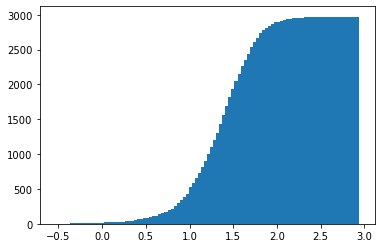

In [402]:
plt.hist(rep1['comment_code_log'], bins=100, cumulative=True);

In [408]:
np.percentile(rep1['comment_code'], 50)

0.24427484143763212

In [472]:
def rep_process(rep):
    rep2 = rep.copy()
    rep2.insert(0, 'absolute_path_max_norm', rep1['absolute_paths_num_lines_max'] / rep1['code'])
    rep2 = rep2[['comment_code_log', 'function_block_num_lines_50%', 'absolute_path_max_norm', 'if_block_num_lines_mean']]
    rep2['function_block_num_lines_50%'] = np.log(rep2['function_block_num_lines_50%'])
    rep2['if_block_num_lines_mean'] = np.log(rep2['if_block_num_lines_mean'])/np.log(10)
    rep2['absolute_path_max_norm'] = np.log(rep2['absolute_path_max_norm'])/np.log(10)
    m = np.isfinite(rep2['absolute_path_max_norm'])
    rep2['absolute_path_max_norm'].where(m, np.nan, inplace=True)/np.log(10)

    return rep2

/Users/michaelstadler/opt/anaconda3/envs/im/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


TypeError: unsupported operand type(s) for /: 'NoneType' and 'float'

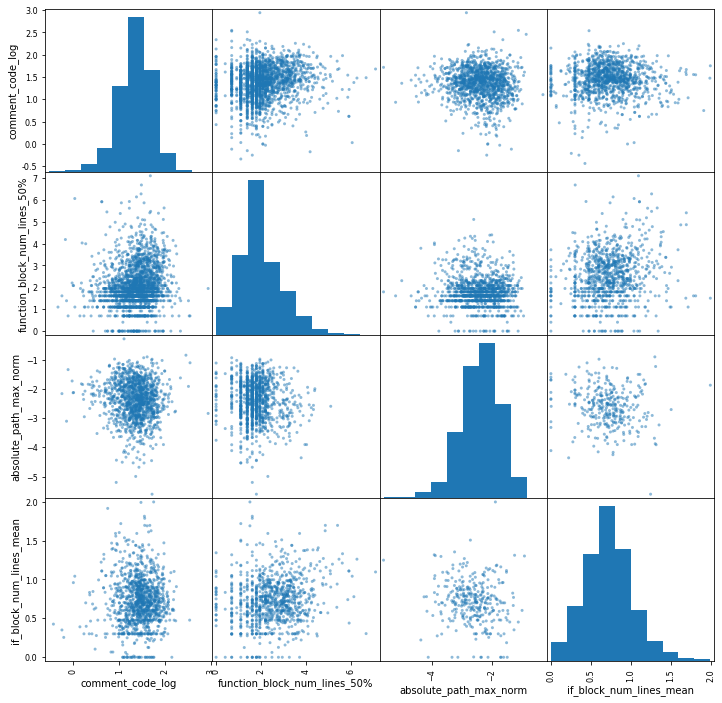

In [473]:
pd.plotting.scatter_matrix(rep2, figsize=(12,12));

In [471]:
rep2['absolute_path_max_norm']

0            NaN
1            NaN
2            NaN
3      -7.453098
4      -4.933446
          ...   
2967   -6.064383
2968         NaN
2969         NaN
2970   -5.462065
2971   -7.641676
Name: absolute_path_max_norm, Length: 2972, dtype: float64

In [466]:
m

0        True
1        True
2        True
3       False
4       False
        ...  
2967    False
2968     True
2969     True
2970    False
2971    False
Name: absolute_path_max_norm, Length: 2972, dtype: bool